## Import libs


In [1]:
import pandas as pd
import warnings
import seaborn as sns
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

## Read data


In [2]:
df = pd.read_csv("../data/processed.csv")

In [3]:
df.head()

,Unnamed: 0,who_region,iso3,country_name,city,year,pm10_concentration,pm25_concentration,no2_concentration,pm10_tempcov,pm25_tempcov,no2_tempcov,population,latitude,longitude,who_ms
0,0,Eastern_Mediterranean,AFG,Afghanistan,Kabul/AFG,2019,39.701,119.774,14.949,67.311111,18.0,19.056359,4221532.0,34.53581,69.19051,1
1,1,Europe,ALB,Albania,Durres/ALB,2014,13.854,7.742,36.734,40.000000,40.0,9.000000,NaN,41.31990,19.44920,1
2,2,Europe,ALB,Albania,Durres/ALB,2015,17.648,12.595,26.634,79.000000,73.0,84.000000,NaN,41.31990,19.44920,1
3,3,Europe,ALB,Albania,Durres/ALB,2016,24.559,14.323,24.785,84.000000,75.0,88.000000,NaN,41.31990,19.44920,1
4,4,Europe,ALB,Albania,Durres/ALB,2017,25.516,14.670,23.213,52.000000,46.0,50.000000,NaN,41.31990,19.44920,1


In [4]:
df.drop(columns=["Unnamed: 0"], inplace=True)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35975 entries, 0 to 35974
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   who_region          35975 non-null  object 
 1   iso3                35975 non-null  object 
 2   country_name        35975 non-null  object 
 3   city                35975 non-null  object 
 4   year                35975 non-null  int64  
 5   pm10_concentration  35975 non-null  float64
 6   pm25_concentration  35975 non-null  float64
 7   no2_concentration   35975 non-null  float64
 8   pm10_tempcov        35975 non-null  float64
 9   pm25_tempcov        35975 non-null  float64
 10  no2_tempcov         35975 non-null  float64
 11  population          19186 non-null  float64
 12  latitude            35975 non-null  float64
 13  longitude           35975 non-null  float64
 14  who_ms              35975 non-null  int64  
dtypes: float64(9), int64(2), object(4)
memory usage: 4.1+

In [6]:
df.describe()

,year,pm10_concentration,pm25_concentration,no2_concentration,pm10_tempcov,pm25_tempcov,no2_tempcov,population,latitude,longitude,who_ms
count,35975.000000,35975.000000,35975.000000,35975.000000,35975.000000,35975.000000,35975.000000,1.918600e+04,35975.000000,35975.000000,35975.000000
mean,2016.356192,31.262045,17.471106,20.137300,87.333703,81.899426,76.684276,7.778155e+05,41.295932,13.750015,0.999361
std,3.068526,27.026342,14.406278,22.700186,20.639707,23.253575,35.123393,2.213688e+06,15.686053,53.137448,0.025277
min,2010.000000,0.730000,1.000000,0.002000,0.000000,0.000000,0.000000,5.000000e+00,-50.708220,-157.946082,0.000000
25%,2014.000000,16.226000,9.578428,11.551500,88.000000,78.218254,78.000000,5.538300e+04,38.896100,0.758800,1.000000
50%,2017.000000,21.482000,13.111000,17.661220,95.000000,90.238866,94.000000,1.598780e+05,44.970000,10.937800,1.000000
75%,2019.000000,32.724000,19.812500,27.499500,98.000000,97.000000,98.000000,5.858770e+05,49.670250,21.813300,1.000000
max,2022.000000,540.000000,436.440000,3670.314000,100.000000,100.000000,100.000000,3.739313e+07,69.677498,178.450000,1.000000


In [7]:
# # Simple pairplot
# sns.pairplot(df, hue="who_region")
# plt.show()

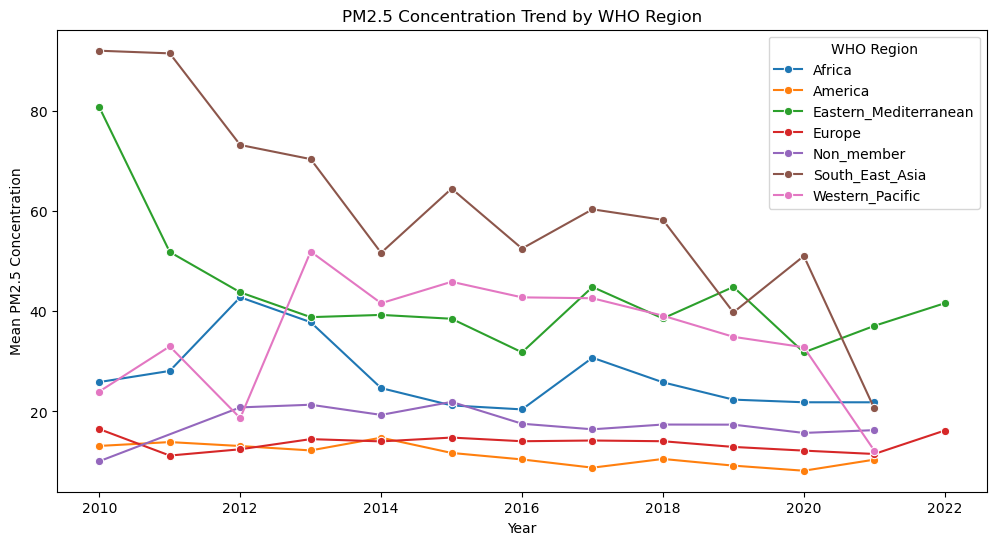

In [8]:
# Define environmental columns
env_cols = [
    "pm10_concentration",
    "pm25_concentration",
    "no2_concentration",
    "pm10_tempcov",
    "pm25_tempcov",
    "no2_tempcov",
]

# Group by region and year, calculate mean
df_grouped = df.groupby(["who_region", "year"])[env_cols].mean().reset_index()

# Example: PM2.5 concentration
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=df_grouped, x="year", y="pm25_concentration", hue="who_region", marker="o"
)
plt.title("PM2.5 Concentration Trend by WHO Region")
plt.xlabel("Year")
plt.ylabel("Mean PM2.5 Concentration")
plt.legend(title="WHO Region")
plt.show()

In [9]:
# # Define environmental columns
# env_cols = ["pm10_concentration", "pm25_concentration", "no2_concentration",
#             "pm10_tempcov", "pm25_tempcov", "no2_tempcov"]

# # Group by region and year, calculate mean
# df_grouped = df.groupby(["who_region", "year"])[env_cols].mean().reset_index()

# # Setup subplots (2 rows x 3 columns = 6 charts)
# fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True)

# # Flatten axes for easy iteration
# axes = axes.flatten()

# # Loop through pollutants and plot
# for i, col in enumerate(env_cols):
#     sns.lineplot(
#         data=df_grouped,
#         x="year", y=col,
#         hue="who_region", marker="o", ax=axes[i]
#     )
#     axes[i].set_title(f"{col} Trend by WHO Region")
#     axes[i].set_xlabel("Year")
#     axes[i].set_ylabel("Mean Value")

# # Adjust layout
# plt.tight_layout()
# plt.show()

In [10]:
import pandas as pd
import folium
import numpy as np
from branca.colormap import LinearColormap

# Pick the pollutant to map
POLLUTANT = "pm25_concentration"

# City-level mean
city_means = (
    df.groupby(["city", "latitude", "longitude"], as_index=False)[POLLUTANT]
    .mean()
    .rename(columns={POLLUTANT: f"{POLLUTANT}_mean"})
)

city_means = city_means.dropna(subset=["latitude", "longitude"])

# Build color scale
vals = city_means[f"{POLLUTANT}_mean"].to_numpy()
vmin, vmax = np.nanmin(vals), np.nanmax(vals)
cmap = LinearColormap(
    colors=["#2c7bb6", "#ffffbf", "#d7191c"],  # blue → yellow → red
    vmin=vmin,
    vmax=vmax,
).to_step(10)
cmap.caption = f"Mean {POLLUTANT.replace('_', ' ').upper()}"

# Create base map
center_lat = city_means["latitude"].median()
center_lon = city_means["longitude"].median()
m = folium.Map(location=[center_lat, center_lon], zoom_start=2, tiles="cartodbpositron")

# Add city points
for _, row in city_means.iterrows():
    val = row[f"{POLLUTANT}_mean"]
    color = cmap(val) if pd.notna(val) else "#999999"
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=6,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.85,
        weight=0.5,
        tooltip=f"{row['city']}: {val:.2f}",
    ).add_to(m)

# Add legend
cmap.add_to(m)

# ✅ Show directly in notebook
m